In [24]:
# pip install tensorflow
# pip install imgaug

In [1]:
import pandas as pd
import numpy as np
import os
import ntpath
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from keras.layers import Convolution2D,MaxPooling2D,Dropout,Flatten,Dense,Conv2D
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2

In [2]:
#set column names in the dataset
dir = 'track'
columns = ['center','left','right','steering','throttle','reverse','speed']
df = pd.read_csv(os.path.join(dir,'driving_log.csv'),names = columns)

In [3]:
df.head()

,center,left,right,steering,throttle,reverse,speed
0,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.649786
1,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.627942
2,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.622910
3,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.619162
4,C:\Users\Amer\Desktop\new_track\IMG\center_201...,C:\Users\Amer\Desktop\new_track\IMG\left_2018_...,C:\Users\Amer\Desktop\new_track\IMG\right_2018...,0.0,0.0,0.0,0.615438


In [4]:
df.shape

(4053, 7)

In [5]:
# to make easy visualisation of path of img =>remove extra path
def name(path):
    head,tail = ntpath.split(path)
    return tail

# applt this func.to remove extra path 
df['center'] = df['center'].apply(name)
df['left'] = df['left'].apply(name)
df['right'] = df['right'].apply(name)

# display new paths=>shorter paths
df.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2018_07_16_17_11_43_382.jpg,left_2018_07_16_17_11_43_382.jpg,right_2018_07_16_17_11_43_382.jpg,0.0,0.0,0.0,0.649786
1,center_2018_07_16_17_11_43_670.jpg,left_2018_07_16_17_11_43_670.jpg,right_2018_07_16_17_11_43_670.jpg,0.0,0.0,0.0,0.627942
2,center_2018_07_16_17_11_43_724.jpg,left_2018_07_16_17_11_43_724.jpg,right_2018_07_16_17_11_43_724.jpg,0.0,0.0,0.0,0.622910
3,center_2018_07_16_17_11_43_792.jpg,left_2018_07_16_17_11_43_792.jpg,right_2018_07_16_17_11_43_792.jpg,0.0,0.0,0.0,0.619162
4,center_2018_07_16_17_11_43_860.jpg,left_2018_07_16_17_11_43_860.jpg,right_2018_07_16_17_11_43_860.jpg,0.0,0.0,0.0,0.615438


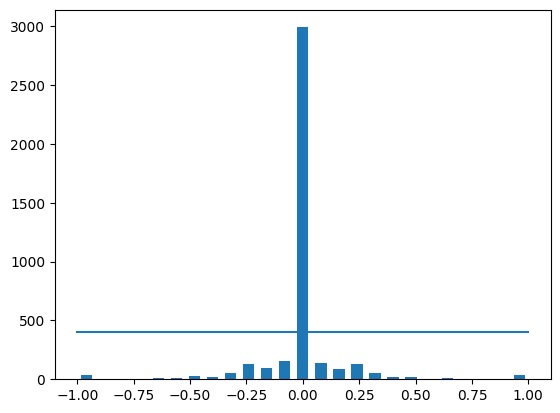

In [6]:
num_bins = 25
sample = 400
hist,bins = np.histogram(df['steering'],num_bins)
center = (bins[:-1] + bins[1:]) * 0.5
plt.bar(center,hist,width = 0.05)      #represents 0 bias graph
plt.plot((np.min(df['steering']),np.max(df['steering'])),(sample,sample)) #create a line,after this line remove all extra 0's

In [7]:
# removing extra 0's
remove_list = []
for j in range(num_bins):
    list_ = []
    for i in range(len(df['steering'])):
        if df['steering'].iloc[i] >= bins[j] and df['steering'].iloc[i] <= bins[j+1]:
            list_.append(i)
    list_ = shuffle(list_)
    list_ = list_[sample:]
    remove_list.extend(list_)

print("No. of removed val:",len(remove_list))
df.drop(df.index[remove_list],inplace = True)
print('Remaining val:',len(df))


No. of removed val: 2590
Remaining val: 1463


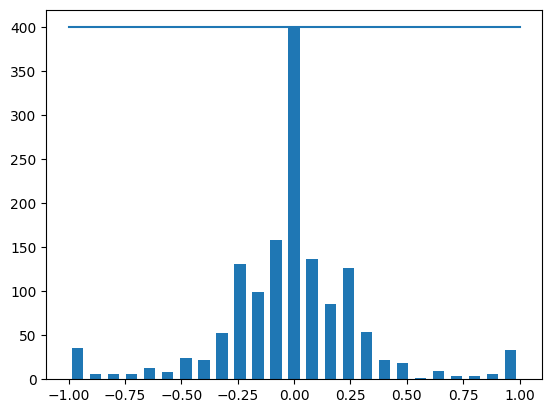

In [8]:
hist,_ = np.histogram(df['steering'],(num_bins))
plt.bar(center,hist,width = 0.05)      #represents 0 bias graph
plt.plot((np.min(df['steering']),np.max(df['steering'])),(sample,sample)) #create a line,after this line remove all extra 0's

In [9]:
def load_img_steering(dir, df):
    image_paths = []
    steerings = []
    for i in range(len(df)):
        index_data = df.iloc[i]
        center, left, right = index_data[0], index_data[1], index_data[2]
        image_paths.append(os.path.join(dir, center.strip()))
        steerings.append(float(index_data[3]))
        # Left image append
        image_paths.append(os.path.join(dir, left.strip()))
        steerings.append(float(index_data[3]) + 0.15)
        # Right image append
        image_paths.append(os.path.join(dir, right.strip()))
        steerings.append(float(index_data[3]) - 0.15)
    image_path = np.asarray(image_paths)
    steering =  np.asarray(steerings)
    return image_path,steering

In [10]:
image_path,steering = load_img_steering(dir+'/IMG',df)

In [11]:
image_path
# len(image_path)

array(['track/IMG\\center_2018_07_16_17_11_44_413.jpg',
       'track/IMG\\left_2018_07_16_17_11_44_413.jpg',
       'track/IMG\\right_2018_07_16_17_11_44_413.jpg', ...,
       'track/IMG\\center_2018_07_16_17_16_30_771.jpg',
       'track/IMG\\left_2018_07_16_17_16_30_771.jpg',
       'track/IMG\\right_2018_07_16_17_16_30_771.jpg'], dtype='<U44')

In [12]:
steering
# len(steering)

array([-0.05,  0.1 , -0.2 , ...,  0.  ,  0.15, -0.15])

In [13]:
x_train,x_test,y_train,y_test = train_test_split(image_path,steering,test_size = 0.2,random_state = 6)
print('Training Samples: {}\nValid sample :{}'.format(len(x_train),len(x_test)))

Training Samples: 3511
Valid sample :878


Text(0.5, 1.0, 'Validation set')

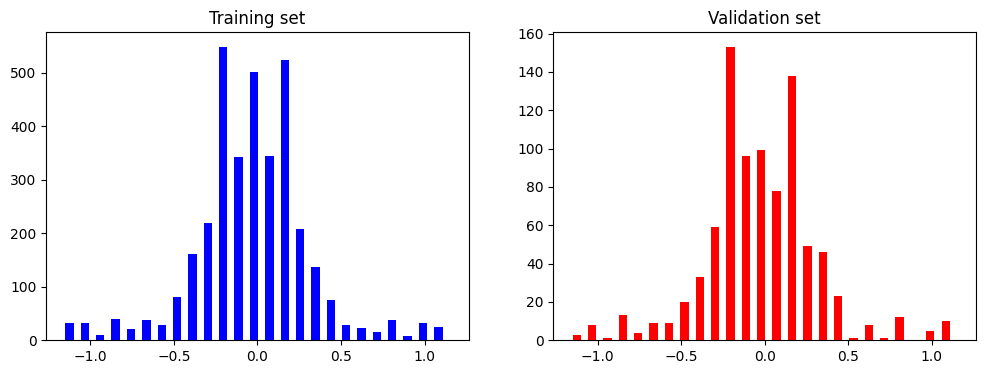

In [14]:
fig,axes = plt.subplots(1,2,figsize = (12,4))
axes[0].hist(y_train,bins = num_bins,width = 0.05,color = 'blue') 
axes[0].set_title("Training set")
axes[1].hist(y_test,bins = num_bins,width = 0.05,color = 'red') 
axes[1].set_title("Validation set")

Text(0.5, 1.0, 'Zoomed Image')

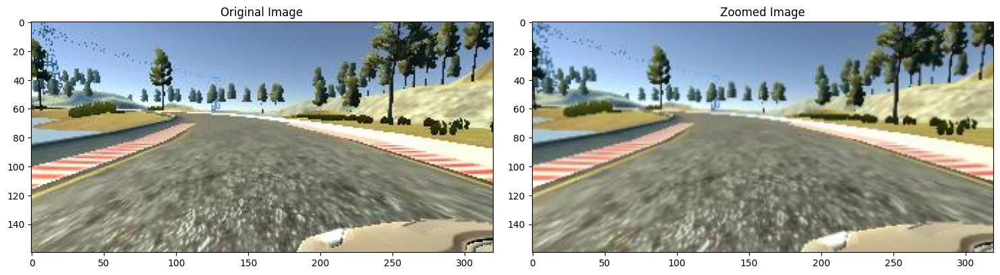

In [15]:
def zoom(image):
    zoom = iaa.Affine(scale = (1,1.3))
    image = zoom.augment_image(image)
    return image

image = image_path[random.randint(0,1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig,axs = plt.subplots(1,2,figsize = (15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

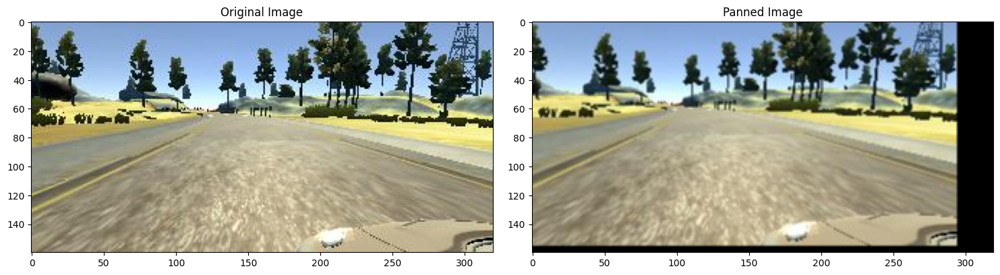

In [16]:
# another augmentation technique
def pan(image):
    pan = iaa.Affine(translate_percent={"x":(-0.1,0.1), "y":(-0.1,0.1)})
    image = pan.augment_image(image)
    return image
    
image = image_path[random.randint(0,1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig,axs = plt.subplots(1,2,figsize = (15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness Altered Image')

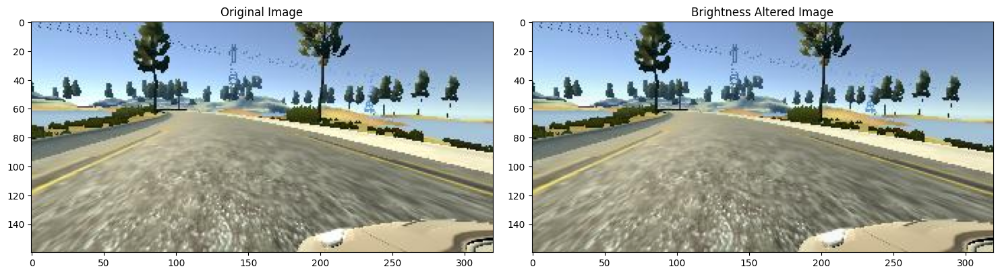

In [17]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2,1.2))
    image = brightness.augment_image(image)
    return image

image = image_path[random.randint(0,1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig,axs = plt.subplots(1,2,figsize = (15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness Altered Image')

Text(0.5, 1.0, 'Flipped Image - :Steering Angle :-0.09999999999999999')

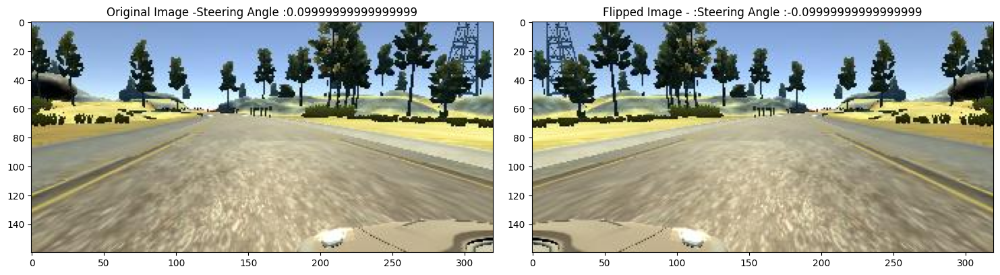

In [18]:
def img_random_flip(image,steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image,steering_angle

random_index = random.randint(0,1000)
image = image_path[random_index]
steering_angle = steering[random_index]

original_image = mpimg.imread(image)
flipped_image,flipped_steering_angle = img_random_flip(original_image,steering_angle)

fig,axs = plt.subplots(1,2,figsize = (15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image -' + 'Steering Angle :' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - :' + 'Steering Angle :' + str(flipped_steering_angle))

In [19]:
def random_augment(image,steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
        image = pan(image)
    if np.random.rand() < 0.5:
        image = zoom(image)
    if np.random.rand() < 0.5:
        image = img_random_brightness(image)
    if np.random.rand() < 0.5:
        image,steering_angle =  img_random_flip(image,steering_angle)
    return image,steering_angle

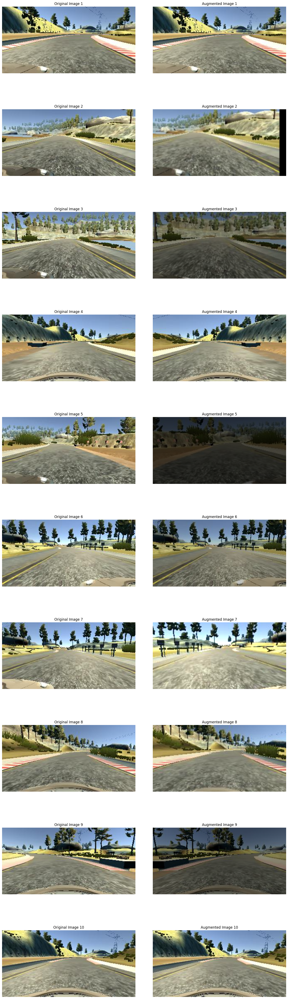

In [20]:
# testing above function.
# nrow = 2
# ncol = 10
# fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
# fig.tight_layout()

# for i in range(10):
#     randnum = random.randint(0, len(image_path) - 1)
#     random_image = image_path[randnum]
#     random_steering = steering[randnum]
#     original_image = mpimg.imread(random_image)
#     augmented_image, random_steering_augmented = random_augment(random_image, random_steering)
#     axs[i][0].imshow(original_image)
#     axs[i][0].set_title("Original Image")
#     axs[i][1].imshow(augmented_image)
#     axs[i][1].set_title("Augmented Image")

n_images = 10  # Number of image pairs to display
fig, axs = plt.subplots(n_images, 2, figsize=(15, 5 * n_images))
fig.tight_layout(pad=3.0)

for i in range(n_images):
    randnum = random.randint(0, len(image_path) - 1)
    random_image = image_path[randnum]
    random_steering = steering[randnum]
    original_image = mpimg.imread(random_image)
    augmented_image, random_steering_augmented = random_augment(random_image, random_steering)
    
    axs[i, 0].imshow(original_image)
    axs[i, 0].set_title(f"Original Image {i+1}")
    axs[i, 0].axis('off')  # Hide axis for better visualization

    axs[i, 1].imshow(augmented_image)
    axs[i, 1].set_title(f"Augmented Image {i+1}")
    axs[i, 1].axis('off')  # Hide axis for better visualization

plt.show()

In [21]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img, (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

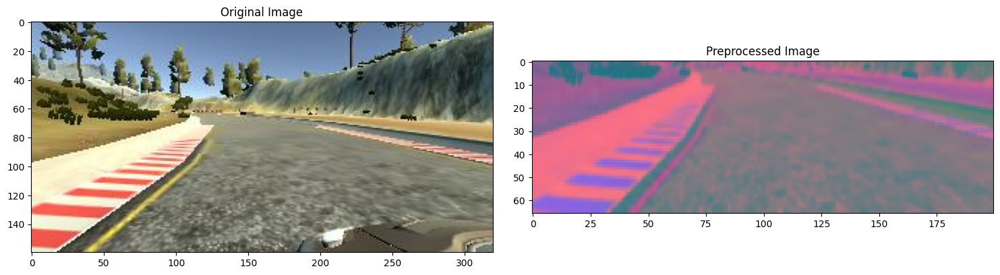

In [22]:
image = image_path[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig,axs = plt.subplots(1,2,figsize = (15,10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [23]:
# batch generator func.=>sends data in batches
def batch_generator(image_path,steering_ang,batch_size,istraining):
    while True:
        batch_img = [] 
        batch_steering = []
        for i in range(batch_size):
            random_index = random.randint(0, len(image_path) - 1)
            if istraining: 
                im, steering = random_augment(image_path[random_index], steering_ang[random_index])
            else: 
                im = mpimg.imread(image_path[random_index]) 
                steering = steering_ang[random_index]
            im = img_preprocess(im)
            batch_img.append(im)
            batch_steering.append(steering)
        yield (np.asarray(batch_img), np.asarray(batch_steering))

In [24]:
x_train_gen, y_train_gen = next(batch_generator(x_train,y_train,1,1))
x_valid_gen,y_valid_gen = next(batch_generator(x_test,y_test,1,0))

Text(0.5, 1.0, 'Validation Image')

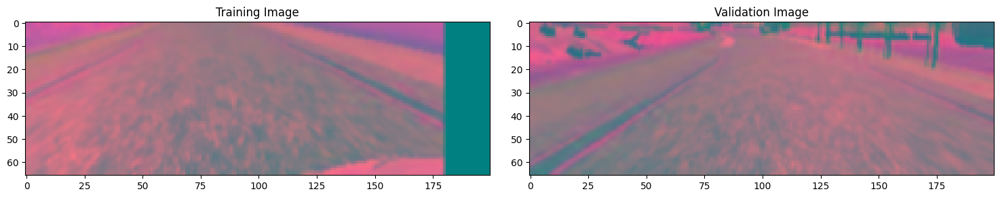

In [25]:
fig,axs = plt.subplots(1,2,figsize = (15,10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [26]:
def nvidia_model(): 
    model = Sequential()
    model.add(Conv2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
    model.add(Conv2D(36, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(48, (5, 5), strides=(2, 2), activation='elu'))
    model.add(Conv2D(64, (5, 5), activation='elu'))
    # model.add(Conv2D (64, (3,3), activation='elu'))
    # model.add(Dropout(0.5))
    
    model.add(Flatten())
    model.add(Dense(100, activation = 'elu'))
    # model.add(Dropout(0.5))
    
    model.add(Dense (50, activation = 'elu'))
    # model.add(Dropout(0.5))
    
    model.add(Dense(10, activation = 'elu'))
    # model.add(Dropout(0.5))
    
    model.add(Dense(1))

    optimizer = tf.keras.optimizers.Adam(learning_rate=1e-3)
    model.compile(loss='mse',optimizer=optimizer)
    return model

model = nvidia_model()
print(model.summary())

C:\Users\mani5\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 31, 98, 24)          │           1,824 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 14, 47, 36)          │          21,636 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 5, 22, 48)           │          43,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 1, 18, 64)           │          76,864 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1152)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 100)                 │         115,300 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 50)                  │           5,050 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │             510 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 1)                   │              11 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 264,443 (1.01 MB)

 Trainable params: 264,443 (1.01 MB)

 Non-trainable params: 0 (0.00 B)

None


In [27]:
history = model.fit(batch_generator(x_train,y_train, 100, 1),
                                                steps_per_epoch=300,
                                                epochs=10,
                                                validation_data=batch_generator(x_train,y_train, 100, 0),
                                                validation_steps=200,
                                                verbose=1,
                                                shuffle = 1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 112s 369ms/step - loss: 0.3026 - val_loss: 0.0738
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 100s 333ms/step - loss: 0.0945 - val_loss: 0.1123
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 104s 346ms/step - loss: 0.1153 - val_loss: 0.1047
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 108s 360ms/step - loss: 0.0925 - val_loss: 0.0616
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 109s 362ms/step - loss: 0.0700 - val_loss: 0.0519
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 107s 357ms/step - loss: 0.0604 - val_loss: 0.0476
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 114s 382ms/step - loss: 0.0562 - val_loss: 0.0386
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 132s 442ms/step - loss: 0.0512 - val_loss: 0.0357
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 128s 427ms/step - loss: 0.0474 - val_loss: 0.0332
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 108s 360ms/step - loss: 0.0440 - val_loss: 0.0295


Text(0.5, 0, 'Epoch')

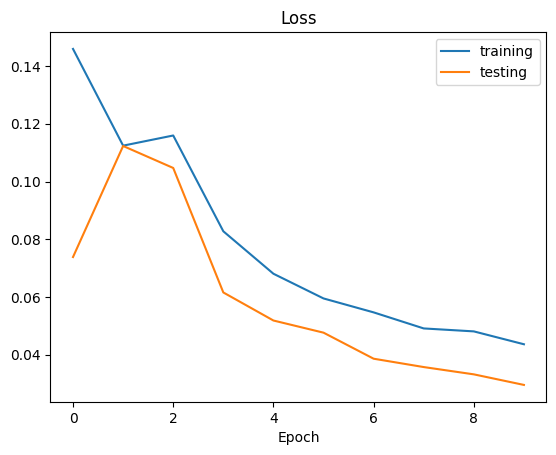

In [30]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training','testing'])
plt.title('Loss')
plt.xlabel('Epoch')

In [31]:
# model_path = 'Files/model.h5'
# model = load_model('model/model.h5')
# model.save('model.h5')


from tensorflow.keras.models import load_model
from tensorflow.keras.metrics import MeanSquaredError
model_path = 'model/model.h5'

# Define custom objects if any
custom_objects = {
    'mse': MeanSquaredError()
}

# Check if the model file exists
if not os.path.isfile(model_path):
    print(f"Error: The file '{model_path}' does not exist. Please check the file path.")
else:
    # Load the model with custom objects
    try:
        model = load_model(model_path, custom_objects=custom_objects)
        print("Model loaded successfully.")
    except Exception as e:
        print(f"Error loading the model from {model_path}: {e}")

    # Save the model to a new file in the recommended format
    save_path = 'model.keras'
    try:
        model.save(save_path)
        print(f"Model saved successfully to {save_path}.")
    except Exception as e:
        print(f"Error saving the model to {save_path}: {e}")

Model loaded successfully.
Model saved successfully to model.keras.
